# DeepDive 1: Decoding Model Intelligence: From Image Classification to Explainable Object Localization

### TABLE OF CONTENTS
1. [**I. Introduction**](#i-introduction)
2. [**II. Quantitative Localization: Turning Visuals into IoU**](#ii-quantitative-localization-turning-visuals-into-iou)
3. [**III. Project Overview**](#iii-project-overview)
4. [**IV. Model Training**](#iv-model-training)
5. [**V. Analysis**](#v-analysis)
6. [**VI. Conclusion**](#vi-conclusion)

## I. Introduction


### 1. Why: The Need for Spatial Intelligence 

Historically, Computer Vision focused on identifying "what" exists within an image. However, as AI moved into critical sectors like autonomous driving and medical imaging, a global label became insufficient. The industry shifted its focus to two critical questions: **"Where exactly is the object?"** and **"On what visual evidence did the model base its decision?"**

To understand this transition, we must look at the structural shift in computer vision tasks:

A. From Global to Local
  * Moving from a single image-level tag to specific pixel coordinates requires the model to learn **Spatial Semantics**—the ability to group pixel clusters into meaningful object entities.

B. The Detection Hierarchy 
  * Object Detection is not a separate entity from Classification; rather, it **encompasses Classification as a core sub-task**, adding a layer of geometric precision.

C. The Role of XAI (Explainable AI)
  * Since standard classification models are trained without explicit location data, we use **CAM (Class Activation Mapping)** and **Grad-CAM**. 
    * These techniques allow us to treat a classification backbone as a **"Weakly Supervised Detector."**
    * They reveal the **Internal Spatial Attention**, proving whether the model is focusing on the actual object or merely "guessing" based on background noise.




### 2. Structural Comparison: Classification vs. Detection

While integrated, these two tasks serve different objectives and utilize distinct evaluation pipelines. Understanding the difference is key to interpreting why we use certain metrics over others.

#### 2-1. Image Classification (The "What")
* **Core Objective**: To map an entire input image to a single discrete category.
* **Data Label (Ground Truth)**: A categorical **Class ID** (e.g., *Index 25: Golden Retriever*).
* **Evaluation Metrics**: 
    * **Accuracy**: The percentage of total images correctly labeled.
    * **F1-Score**: The harmonic mean of Precision and Recall, used to ensure performance is balanced across all classes.
* **Why IoU is Not Used**: The model is not required to output coordinates. As long as the "name" is correct, the prediction is a success, regardless of which pixels triggered the decision.

#### 2-2. Object Detection (The "What" + "Where")
* **Core Objective**: To simultaneously perform **Classification** (identity) and **Localization** (spatial boundary).
* **Data Label (Ground Truth)**: A **Class ID** paired with **Bounding Box Coordinates** ($x, y, w, h$).
* **Evaluation Metrics**: 
    * **mAP (mean Average Precision)**: The gold standard that calculates precision across multiple categories and overlap thresholds.

        >* **IoU** is the **Unit of Measurement** (The meter stick).
        >* **mAP** is the **Statistical Summary** (The final grade).
        >* They are linked by the **Threshold**: The threshold is the rule that turns a continuous IoU value into a binary "Right/Wrong" decision so that Precision and Recall can be calculated.




##### **Q1. WHat is the Relationship Between IoU and mAP?**
We need to look at the hierarchy of evaluation in Object Detection.

**A. IoU: The Individual "Decision" Metric**
* IoU is the criterion used to determine if a single prediction is **Correct (True Positive)** or **Incorrect (False Positive)**. Without IoU, we wouldn't know which predictions to count as "right."
$$IoU = \frac{\text{Area of Overlap}}{\text{Area of Union}}$$

* **The Rule**: If $IoU \ge \tau_{IoU}$ (e.g., 0.5) AND the Class is correct, the prediction is a **True Positive (TP)**. 
* **Why IoU is Mandatory**:
    * **Validation of Intent**: We must verify if the predicted box overlaps with the actual object. 
    * **Filtering "Lucky" Guesses**: Even if the model correctly identifies a "Dog," the prediction is marked as a **False Positive** if the box is drawn in the empty sky (Low IoU). IoU ensures the classification result is tethered to the correct physical object.


**B. mAP: The Global "Aggregated" Metric**
* mAP is the final score that summarizes thousands of those IoU decisions across your entire dataset.
  * **Precision-Recall Curve**: For a specific class (e.g., "Beagle"), we plot Precision and Recall based on the TP/FP labels determined by our **IoU Judge**.
  * **Average Precision (AP)**: This is the area under that Precision-Recall curve.
  * **Mean Average Precision (mAP)**: This is the mean of the AP values across all 120 dog breeds.

> **In short: IoU tells us if ONE box is good. mAP tells us how good the ENTIRE model is at finding ALL boxes across ALL classes.**



##### **Q2. Why we use mAP (mean Average Precision) instead of F1-Score?** 
In **Classification**, a prediction is either 100% right or 100% wrong. The F1-score works perfectly here. 
In **Detection**, a prediction can be "right about the class but 40% wrong about the location." 
* **F1-Score** cannot capture this "gradient of spatial accuracy." 
* **mAP**, by integrating IoU thresholds, provides a much more nuanced view of how reliable the model's spatial intelligence truly is.

Thus, while F1-score gives a snapshot at one specific point, **mAP** is the "Gold Standard" for detection because:
1.  **Averaging over Classes**: It calculates the Average Precision (AP) for each of the 120 dog breeds and means them.
2.  **Averaging over Thresholds**: mAP (specifically mAP@.5:.95) calculates the area under the Precision-Recall curve across multiple IoU levels. 
3.  **Comprehensive Assessment**: It rewards models that are both **confident in their classification** and **precise in their localization**.


| Comparison Criteria | **F1-Score** | **mAP (mean Average Precision)** |
| :--- | :--- | :--- |
| **Threshold Type** | **Fixed** (Single Confidence & IoU) | **Integrated** (Range of IoU Thresholds) |
| **Position** | A **Specific Point** on the PR Curve | The **Total Area** under the PR Curve |
| **Formula (Core)** | $$F1 = 2 \cdot \frac{Precision \cdot Recall}{Precision + Recall}$$|$$mAP = \frac{1}{N} \sum_{i=1}^{N} AP_i$$ |
| **Role of IoU** | **The Binary Filter ($\tau$):** <br> $TP$ if $IoU \ge \tau$ (e.g., 0.5) | **The Average Target:** <br> $mAP@[.5:.95] = mean(AP_{0.5}, AP_{0.55}, ..., AP_{0.95})$ |
| **Class Scope** | Calculated **for one class** at a time | **Averages across all $N$ classes** |
| **Summary** | "How accurate is the model at **this specific decision**?" | "How intelligent is the model **overall**?" |

**1. How IoU Defines the "Input" for F1-Score**

In Object Detection, you cannot calculate Precision or Recall without a fixed IoU threshold ($\tau$). The number of **True Positives (TP)** is a function of $\tau$:
$$TP(\tau) = \sum \text{Predictions where } (Class_{pred} = Class_{gt}) \text{ AND } (IoU \ge \tau)$$
$$F1(\tau) = 2 \cdot \frac{Precision(\tau) \cdot Recall(\tau)}{Precision(\tau) + Recall(\tau)}$$
* Insight: If you change $\tau$ from 0.5 to 0.9, the $TP$ count drops, and your **F1-score changes completely.**

**The Dual-Threshold  Formula**
$$TP(\tau_{IoU}, \tau_{conf}) = \sum_{i=1}^{N} \mathbb{1} \left( IoU_i \ge \tau_{IoU} \quad \text{AND} \quad Score_i \ge \tau_{conf} \right)$$
$$F1(\tau_{IoU}, \tau_{conf}) = 2 \cdot \frac{Precision(\tau_{IoU}, \tau_{conf}) \cdot Recall(\tau_{IoU}, \tau_{conf})}{Precision(\tau_{IoU}, \tau_{conf}) + Recall(\tau_{IoU}, \tau_{conf})}$$
  * **$\tau_{IoU}$**: Spatial Strictness (Spatial Accuracy to judge the box's location)
  * **$\tau_{conf}$**: Confidence Cutoff (Predictive Certainty to judge the model's confidence)

**2. How mAP Integrates the Entire PR Curve**

Unlike F1, which is a single point, **AP (Average Precision)** is the area under the Precision-Recall curve. It essentially "adds up" the precision at every possible recall level:
$$AP = \int_{0}^{1} p(r) dr$$
Then, **mAP** takes it a step further by averaging these areas across different IoU hurdles:
$$mAP_{final} = \frac{1}{|Thresholds|} \sum_{\tau_{IoU}\in \{.5, ..., .95\}} \left( \frac{1}{|Classes|} \sum_{c \in Classes} AP_{c, \tau_{IoU}} \right)$$



##### **Q3. Relationship between Precision-Recall Trade-off and IoU**

This is where the relationship becomes "dynamic." The Precision and Recall values—and therefore the mAP—**change** depending on how strict your IoU Judge is.

**A. The "Hurdle" Effect**

Think of the **IoU Threshold** as the height of a hurdle in a race:
* **Low Hurdle (IoU @ 0.5)**: It is easy for the model to "pass." Even a messy box that only overlaps 50% counts as a True Positive. 
    * High Recall (you find many objects)
    * Potentially lower Precision.
* **High Hurdle (IoU @ 0.9)**: It is very hard to pass. The box must be near-perfect.
    * Low Recall (many "okay" boxes are now rejected as False Positives)
    * Very high Precision (only the best boxes remain).

**B. Why mAP is the "Gold Standard"**

Instead of picking just one hurdle height, the industry standard (**COCO mAP**) calculates the Average Precision at **10 different IoU thresholds** (from 0.5 to 0.95, with 0.05 steps) and averages them. 

$$mAP@[.5:.95] = \frac{1}{10} \sum_{threshold=0.5}^{0.95} AP_{threshold}$$

This forces the model to be **both** a good classifier and a highly accurate localizer to get a high score.

**C.The Meaning of Axes and Points in a PR Curve**

It is crucial to understand that a PR Curve is plotted for **one fixed IoU Threshold**, while the points on that curve are generated by varying the **Confidence Threshold**.

* **X-axis (Recall):** The proportion of actual objects successfully captured by the model.
* **Y-axis (Precision):** The proportion of "correct" guesses among all predictions made by the model.
* **The Point (Confidence Threshold):** Each dot on the PR curve represents a specific **Confidence Threshold** (the probability score $0.0 \sim 1.0$). 
    * If you set a **high Confidence Threshold (e.g., 0.9)**, the point moves to the **top-left** (High Precision, Low Recall).
    * If you set a **low Confidence Threshold (e.g., 0.1)**, the point moves to the **bottom-right** (Low Precision, High Recall).

**Q4. "Two-Gate" system: Mathematical Role of Each Threshold**

The reason these two are different is that they appear in two different "functions" of the detection pipeline. One defines the **Validity** of the data, and the other defines the **Acceptance** of the prediction.

| Feature | **IoU Threshold ($\tau_{IoU}$)** | **Confidence Threshold ($\tau_{conf}$)** |
| :--- | :--- | :--- |
| **Mathematical Role** | **The Conditional Function** | **The Decision Function** |
| **Formula Context** | Defines $TP$ vs $FP$ status: <br> $Status = \begin{cases} TP & \text{if } IoU \ge \tau_{IoU} \\ FP & \text{if } IoU < \tau_{IoU} \end{cases}$ | Filters output boxes: <br> $Output = \{Box \mid Score \ge \tau_{conf}\}$ |
| **Effect on Metrics** | It changes the **Total Count** of possible True Positives. | It moves the **Position** of the point on the PR Curve. |
| **PR Curve Logic** | Determines the **Shape and Height** of the curve. | Determines the **Specific Coordinates** $(R, P)$ on that curve. |



##### 1. IoU Threshold ($\tau_{IoU}$): The Spatial Filter
The IoU threshold is applied **before** we even think about probabilities. It creates the "Ground Truth" for our evaluation.
$$IoU(A, B) = \frac{Area(A \cap B)}{Area(A \cup B)}$$
In the evaluation script, we use this to define whether a prediction $P_i$ is a "True Positive" relative to the target threshold $\tau_{IoU}$:
$$\mathbb{1}_{TP}(P_i) = [IoU(P_i, GT) \ge \tau_{IoU}] \cdot [Class(P_i) = Class(GT)]$$
* Think of this as the "Judge" deciding if the model's box is "close enough" to be considered a serious attempt.



##### 2. Confidence Threshold ($\tau_{conf}$): The Acceptance Filter
Once we know which boxes *could* be correct (based on IoU), we decide which ones we actually *trust* based on the model's probability output $S_i$. 
We calculate **Precision** and **Recall** at a specific $\tau_{conf}$:
$$Precision(\tau_{conf}) = \frac{|\{P_i \mid S_i \ge \tau_{conf} \text{ and } \mathbb{1}_{TP}(P_i) = 1\}|}{|\{P_i \mid S_i \ge \tau_{conf}\}|}$$
$$Recall(\tau_{conf}) = \frac{|\{P_i \mid S_i \ge \tau_{conf} \text{ and } \mathbb{1}_{TP}(P_i) = 1\}|}{\text{Total Ground Truths}}$$
* By sliding $\tau_{conf}$ from $1.0$ down to $0.0$, we generate all the $(R, P)$ pairs that form the PR Curve for that specific $\tau_{IoU}$.


| Level | Dominant Threshold | Action happening at this level |
| :--- | :--- | :--- |
| **1. IoU** | **IoU Threshold** | Setting the "Pass/Fail" bar for spatial overlap. |
| **2. PR Curve** | **Confidence Threshold** | Sliding the probability bar to **plot the dots** on the graph. |
| **3. Multi-Curve** | **IoU Threshold** | Changing the strictness of the "Pass/Fail" bar to **create new lines**. |
| **4. mAP** | **Both** | Calculating the **Total Average** of all lines and all dots. |



##### Why this hierarchy matters for CAM/Grad-CAM :
We aren't just doing classification; we are evaluating **Localization**. 
1. **Classification Score** (from the Softmax/Dense layer) provides the **Confidence**.
2. **CAM Heatmap** (turned into a Bounding Box) provides the **IoU**.

By calculating the **IoU** between your CAM-box and the Ground Truth, we are proving that our model’s "Confidence" isn't just a high number—it's actually coming from the right spatial location.




##### **Q5. The Hierarchical Structure of Detection Metrics**

##### **1. The Foundation: IoU (Single Prediction Level)**

At the very bottom, we look at **one single box**. 
* **Calculation**: We measure the area of overlap between your prediction and the label.
* **The Threshold ($\tau_{IoU}$):** This is a fixed "pass/fail" mark.
    * If $IoU \ge 0.5$, we label this box as a **True Positive (TP)**.
    * If $IoU < 0.5$, it becomes a **False Positive (FP)**.
* **Key Point**: IoU is just a raw geometric number ($0.0 \sim 1.0$), but the **Threshold** turns it into a binary "Right" or "Wrong."



##### **2. The First Floor: Precision-Recall Curve (Fixed Threshold Level)**

Once we have categorized every prediction as either a "Hit" (True Positive) or a "Miss" (False Positive) based on **one fixed spatial threshold** ($\tau_{IoU} = 0.5$), we can evaluate the model's performance across the entire dataset. 

At this stage, the **IoU Threshold ($\tau_{IoU}$)** is treated as a constant, while the **Confidence Threshold ($\tau_{conf}$)** acts as the dynamic variable that drives our analysis.

**2-1. The Process: Sliding the Confidence Threshold ($\tau_{conf}$)**
To understand the model's reliability, we don't just pick one probability cutoff. Instead, we "slide" the **$\tau_{conf}$** from $1.0$ down to $0.0$:

1.  **Ranking**: All predictions are ranked by their confidence scores ($S$) in descending order.
2.  **Filtering**: For any given value of $\tau_{conf}$, we only "accept" predictions where $S \ge \tau_{conf}$.
3.  **Coordinate Generation**: For every $\tau_{conf}$ value, we calculate a specific pair of metrics:
    * **$Precision(\tau_{conf}) = \frac{TP}{TP + FP}$**: Among all accepted predictions, what fraction are actually correct?
    * **$Recall(\tau_{conf}) = \frac{TP}{\text{Total Ground Truths}}$**: Out of all actual objects in the dataset, how many did the model successfully find?



**2-2. The Result: A Performance Panorama (AP)**
As $\tau_{conf}$ moves from $1.0$ (High Certainty) to $0.0$ (Low Certainty), we plot these $(Recall, Precision)$ coordinates. Connecting these dots forms the **Precision-Recall Curve**.

* **AP (Average Precision)**: This is calculated by finding the **Area Under the Curve (AUC)**. Mathematically, it is the integration of Precision over the Recall range:
    $$AP = \int_{0}^{1} p(r) \, dr$$
* **Significance**: AP represents the model's potential at a specific "strictness" level ($\tau_{IoU}$). It tells us: *"If we consider every possible confidence level, how good is this model at finding this specific breed?"*


##### **3. The Second Floor: Multiple Curves (Multi-Threshold Level)**
A model that is good at a 0.5 threshold($\tau_{IoU}$) might be terrible at a 0.7 threshold (meaning it finds objects but draws messy boxes).
* **The Variety**: To see the full picture, we draw **multiple PR curves**:
    * A curve for $IoU=0.5$ (Easy/Loose)
    * A curve for $IoU=0.7$ (Medium)
    * A curve for $IoU=0.9$ (Strict/Precise)
* **Observation**: As the threshold gets higher (stricter), the curve usually shrinks inward because more boxes are failed by the "IoU Judge."



##### **4. The Roof: mAP (The Final Average)**

Finally, we want one single number to put on our blog or report.
* **Step A (Mean over Classes)**: First, we calculate the AP for each of your 120 dog breeds and average them. This ensures the model is "fair" to all breeds.
* **Step B (Mean over Thresholds)**: Then, we take the results from all those different "strictness levels" (0.5, 0.55, ..., 0.95) and average them all together.
* **The Result ($mAP@[.5:.95]$):** This is the ultimate "Global Score."


| Level | Metric | What it answers |
| :--- | :--- | :--- |
| **Geometric** | **IoU** | Is *this specific box* overlapping enough with the dog? |
| **Statistical** | **AP @ 0.5** | At a *moderate strictness*, how well did the model find *this breed*? |
| **Comprehensive** | **mAP @ [.5:.95]** | Overall, how *accurate and precise* is this model across *all breeds* and *all levels of strictness*? |


## II. Quantitative Localization: Turning Visuals into IoU

### 1. The Bridge: Visualization as a Bounding Box Generator
The primary goal of **CAM, Grad-CAM, and ACOL** is to provide a measurable spatial area ($Area_{pred}$). Without these methods, we only have a probability score; with them, we obtain a **Bounding Box**.

* **Extraction**: We apply an **Activation Threshold ($\tau_{heat}$)** to the heatmap intensity.
* **Transformation**: This creates a binary mask, which is then converted into a set of coordinates $(x, y, w, h)$.
* **The Result**: We now have a "Physical Prediction" that can be mathematically compared to the "Physical Truth" (Ground Truth).

#### The Metric: IoU as the Quality Filter
Visualization methods exist to produce the **IoU (Intersection over Union)**. This metric is the only way to verify if the model's classification is factually grounded.

$$IoU = \frac{Area(Box_{visual} \cap Box_{gt})}{Area(Box_{visual} \cup Box_{gt})}$$

* **Spatial Validation**: If $IoU < 0.5$, we categorize the prediction as a **False Positive**, regardless of the Softmax score. 
* **Localization Rigor**: By calculating IoU, we force the model to prove it didn't just "guess" the class based on background noise or unrelated features.

#### Why this matters for Comparative Analysis
We use this IoU-based framework to compare **CAM, Grad-CAM, and ACOL**. This allows us to move beyond subjective "it looks better" arguments and use objective data:

1.  **Strictness Test**: We observe how many predictions survive as **True Positives** as we raise the IoU threshold ($\tau_{IoU}$) from 0.5 to 0.9.
2.  **mAP Ranking**: We rank these methods based on their **mean Average Precision**, which summarizes their ability to consistently produce high-IoU boxes across all classes.





### 2. Technical Deep Dive: CAM vs. Grad-CAM vs. ACOL**

#### **2-1. CAM (Class Activation Mapping)**
CAM is the "original" method. It assumes that the weights in the final layer represent the importance of the spatial features.

* **The Mechanism**: After training, we have a set of weights $w_k^c$ from the **Global Average Pooling (GAP)** layer connected to the output neuron of class $c$. 
* **The Calculation**: We take the feature maps $f_k(x, y)$ from the last convolutional layer and perform a weighted sum using those fixed, updated weights:
$$M_c(x, y) = \sum_{k} w_k^c f_k(x, y)$$
* **Constraint**: You **must** have a GAP layer. If your model uses a Flatten layer, the spatial information is destroyed, making CAM impossible without changing the architecture and **retraining** the entire model.
* **Pros/Cons**: 
  * It is mathematically "pure" because it uses the model's actual decision weights
  * But it is rigid and requires a specific architecture.


#### **2-2. Grad-CAM (Gradient-weighted CAM)**
Grad-CAM was invented to overcome the "GAP requirement." Instead of looking at fixed weights, it looks at **Gradients**—the flow of information during a backward pass for a specific image.

* **The Mechanism**: 
    1.  Perform a forward pass to get the score for class $c$.
    2.  Perform a **partial backward pass** to find the gradient of score $Y^c$ with respect to the feature map $A^k$.
* **The Calculation**: 
  * First, we compute the "neuron importance weights" ($\alpha_k^c$) by averaging the gradients across the width ($i$) and height ($j$):
$$\alpha_k^c = \frac{1}{Z} \sum_{i} \sum_{j} \frac{\partial Y^c}{\partial A_{ij}^k}$$
  * Then, we combine the feature maps and apply a **ReLU** to keep only the features that have a *positive* influence on the class:
$$L_{Grad-CAM}^c = \text{ReLU} \left( \sum_{k} \alpha_k^c A^k \right)$$
* **Pros/Cons**
  * You can use it on **any** pre-trained model (like a standard ResNet or VGG) without retraining.
  * However, because it relies on gradients, it can sometimes be "noisy" or over-focus on small, sharp textures rather than the whole object.



#### **2-3. ACOL (Adversarial Complementary Learning)**
ACOL is a more advanced "Training-time" strategy designed specifically for **Object Localization (WSOL)**. It solves the problem of "sparse attention" (where CAM only looks at the head of a bird).

* **The Mechanism**: It uses two parallel classifier branches ($Classifier A$ and $Classifier B$).
    1.  **Branch A** identifies the most discriminative part (the most obvious feature).
    2.  **Adversarial Erasing**: The regions identified by Branch A are **erased** or masked from the feature map.
    3.  **Branch B** is then forced to find the class using only the *remaining* pixels.
* **The Calculation**: The final heatmap is a fusion of both branches. By forcing the model to find the class twice—once with the best features and once without them—the model learns to see the **entire body** of the object.
* **Pros/Cons**: It produces the **highest IoU** because it discovers the "full extent" of the object. The downside is that it requires a custom, complex architecture and a specialized training process.




| Feature | **CAM** | **Grad-CAM** | **ACOL** |
| :--- | :--- | :--- | :--- |
| **Logic** | Fixed Weights | Dynamic Gradients | Adversarial Masking |
| **Input for Heatmap** | $w$ (from Dense layer) | $\frac{\partial Y}{\partial A}$ (Gradients) | Fused multi-branch maps |
| **ReLU usage** | Not standard | **Mandatory** (to filter noise) | Built into the masking logic |
| **Localization Quality** | Moderate | Focused/Sharp | **Broad/Complete** |

#### Q1. What is a Feature Map and how is it calculated?

Since we only have the **Input Image ($X$)** and the **Weights ($W$)**, the Feature Map is the "activation" or the "bridge" created when they interact.

* **The Process**: A feature map $f_k$ is the result of a **Convolution operation**. The filters ($W_{spatial}$) slide over the image ($X$) to see where specific patterns match.
* **The Formula**: $$f_k = \sigma(W_k * X)$$ (where $*$ is convolution and $\sigma$ is an activation function like ReLU).
* **Is CAM just Input $\times$ Weight?**: Not exactly. It is a hierarchical multiplication:
    * **Step A**: $Input \times W_{spatial} \rightarrow$ **Feature Maps** (Visual patterns).
    * **Step B**: $Feature Maps \times W_{discriminative} \rightarrow$ **Class Activation Map** (Visual evidence for a specific label).
>**The Dual-Nature of Trained Weights**
>When we train a CNN (like ResNet), the "Updated Weights" we save actually consist of two functional categories:
>1.  **Feature-Extracting Weights (Spatial Filters)**: These are the weights in the convolutional layers. They learn to detect physical patterns like edges, textures, and shapes. Their output is the **Feature Map**.
>2.  **Class-Discriminative Weights (Decision Weights)**: These are the weights in the final Fully Connected (Dense) layer. They learn which features are important for a specific class (e.g., "Pointy ears" are important for 'Cat', but not for 'Toaster').


####  Q2. Grad-CAM vs. CAM: Mathematical Identity

The relationship between these two depends entirely on which layer you are looking at.

**A. At the Final Layer (Layer 4 in ResNet50)**:

If the model uses Global Average Pooling (GAP), the "Importance weight" ($\alpha_k^c$) calculated by Grad-CAM’s gradients is **mathematically identical** to the Class-Discriminative Weight ($w_k^c$) used in CAM. 
> The Mathematical Proof: Grad-CAM = CAM at the Final Layer
1. In a standard CAM-compatible architecture (like ResNet50), the score for class $c$ ($Y^c$) before the Softmax is defined as:
$$Y^c = \sum_k w_k^c \cdot \underbrace{\left( \frac{1}{Z} \sum_i \sum_j A_{ij}^k \right)}_{F_k (GAP output)}$$
Where:
 * $A_{ij}^k$: The activation at location $(i, j)$ in feature map $k$.
 * $Z$: The number of pixels in the feature map ($Z = \text{width} \times \text{height}$).
 * $w_k^c$: The **Class-Discriminative Weight** for class $c$ and feature map $k$.
1. Now, let's find the **Grad-CAM weight** ($\alpha_k^c$) by taking the gradient of $Y^c$ with respect to the feature map $A^k$:
$$\frac{\partial Y^c}{\partial A_{ij}^k} = \frac{\partial}{\partial A_{ij}^k} \left( \sum_m w_m^c \cdot \frac{1}{Z} \sum_{i'} \sum_{j'} A_{i'j'}^m \right)$$
Since the derivative of $A_{i'j'}^m$ with respect to $A_{ij}^k$ is $1$ only when $m=k, i'=i, j'=j$ (and $0$ otherwise), the summation collapses to:

$$\frac{\partial Y^c}{\partial A_{ij}^k} = \frac{w_k^c}{Z}$$
3. Finally, to get the Grad-CAM importance weight $\alpha_k^c$, we average these gradients over all pixels $(i, j)$:

$$\alpha_k^c = \frac{1}{Z} \sum_i \sum_j \frac{\partial Y^c}{\partial A_{ij}^k} = \frac{1}{Z} \sum_i \sum_j \frac{w_k^c}{Z}$$
Since $\sum_i \sum_j (1) = Z$, the $Z$ terms cancel out:

$$\alpha_k^c = \frac{1}{Z} \cdot Z \cdot \frac{w_k^c}{Z} = \frac{w_k^c}{Z}$$

> **Conclusion**: At the last layer, **Grad-CAM = CAM**.

**B. At Intermediate Layers (Layer 1, 2, or 3)**:
* CAM **cannot** be used here because these layers are not directly connected to the final Softmax. There is no "Class-Discriminative Weight" for a middle layer. 
* However, **Grad-CAM** works here because it uses **Gradients**. By backpropagating the error from the output back to Layer 2, we can "calculate" how much that specific layer influenced the final score.

**C. Different Models: VGG and AlexNet (The Flatten Problem)**
 * The Structural Difference
   * These models do not use GAP. Instead, they use a **Flatten** layer followed by multiple **Fully Connected (FC)** layers:
  `Conv Layers` $\rightarrow$ `Flatten` $\rightarrow$ `FC1` $\rightarrow$ `FC2` $\rightarrow$ `Output`

  * Why CAM Fails (Mathematically)
    * In CAM, we need a direct relationship between the $k$-th feature map and the class score. In VGG, the score $Y^c$ is:
          $$Y^c = w_{FC2} \cdot \sigma(w_{FC1} \cdot \text{Flatten}(A^k))$$
    * Because of the non-linear activation ($\sigma$) and multiple weight matrices between the feature map and the output, there is no single $w_k^c$ we can "pick" to multiply with the feature map. To use CAM, you would have to **remove the FC layers**, add a GAP, and **retrain** the model.
  * How Grad-CAM Succeeds
    * Grad-CAM doesn't care about the architecture. It treats the entire "Flatten + FC layers" block as a complex function $f(A^k)$.
          $$\alpha_k^c = \text{Global Average} \left( \frac{\partial Y^c}{\partial A^k} \right)$$
    * Even if there are 100 FC layers and various activation functions in between, **the Chain Rule of Calculus** allows the gradient to flow back to the convolutional layer.



**D. The "GAP Surgery": From Flatten to Spatial Awareness**

**1. Why were these versions created?**

The original architectures looked like this:
* **Original**: `[Conv Layers] → [Flatten] → [FC (4096)] → [FC (4096)] → [Softmax]`
* **The Problem**: Once the feature maps are "Flattened," you can no longer tell which pixel $(i, j)$ belonged to which part of the image. You lose the "Where."

**2. The Transformation (The "GAP" Hack)**

To make them "CAM-compatible," the structure is modified:
* **Modified**: `[Conv Layers] → [GAP] → [Softmax]`
* **How it works**: 
    1.  Take the last feature map (e.g., $512 \times 7 \times 7$ in VGG16).
    2.  Apply **GAP** to reduce it to a $512 \times 1$ vector (each value is the average of a $7 \times 7$ map).
    3.  Connect this vector **directly** to the final output.
    4.  **Retrain** the model so the new weights ($w_k^c$) learn the importance of each feature map.

| Feature | **VGG-GAP** | **Alexnet-GAP** |
| :--- | :--- | :--- |
| **Base Backbone** | VGG16 / VGG19 | AlexNet |
| **Last Conv Layer** | `conv5_3` (High resolution) | `conv5` (Lower resolution) |
| **Localization Quality** | **Higher.** Because VGG has deeper and more sophisticated filters, the resulting CAM heatmaps are usually more precise. | **Lower.** AlexNet has larger kernels and fewer layers, leading to "blockier" and less detailed heatmaps. |
| **Retraining Difficulty** | High (VGG is heavy). | Low (AlexNet is lightweight). |

**3. Relation to ACOL**

Interestingly, **ACOL (Adversarial Complementary Learning)** often uses a **VGG-GAP backbone**. 
* ACOL takes the feature-extracting power of VGG and adds its "Two-Branch" system on top of the GAP layer to force the model to look at the entire object.


#### Q4. Is CAM "Pure"? What about Grad-CAM?

The term "Pure" refers to the **source of truth**.

* **CAM (Pure Knowledge)**: It uses the **static weights** fixed in the model's brain. It shows what the model "knows" generally about a class.
* **Grad-CAM (Dynamic Reaction)**: It uses **gradients**, which are calculated per image. It shows how the model "reacts" to a specific instance. If you change the image slightly, the gradients change, even if the weights stay the same.



#### Q5. How can Grad-CAM see every layer without updating?

You don't need to update or retrain the model to use Grad-CAM. It uses the **Backpropagation mechanism** that is already built into deep learning frameworks (like PyTorch or TensorFlow).

* **The "ReLU" Secret**: 
    In the Grad-CAM formula, we apply **ReLU** to the final weighted sum: $$L_{Grad-CAM}^c = \text{ReLU}(\sum \alpha_k^c A^k)$$
    We do this because we only care about pixels that have a **positive influence** on the class score. 
    * **Positive Gradient**: "If I increase the intensity here, the 'Dog' score goes up." (Keep it).
    * **Negative Gradient**: "If I increase the intensity here, the 'Dog' score drops." (Filter it out).
    
This ReLU filtering is what makes the Grad-CAM heatmap look so much cleaner and more "focused" than the raw feature maps.

## III. Project Overview

### 1. The Lifecycle of an Interpretability Project: From Weights to Bounding Boxes

#### **Stage 1: The Training Phase (Building the Brain)**
Before we can visualize anything, the model must learn to recognize features.
1.  **Architecture Setup**: We use a backbone like **ResNet50**. To make it "CAM-compatible," we remove the fully connected layers and add a **Global Average Pooling (GAP)** layer followed by a single **Dense Layer**.
2.  **Forward Pass**: The image pixels pass through convolutional layers, extracting spatial features.
3.  **Loss Calculation & Backpropagation**: The model compares its prediction to the label. Errors are sent backward through the network to update the weights.
4.  **Convergence**: Once training is finished, we have a "frozen" model with optimized weights that know which pixels represent a "Beagle."


#### **Stage 2: The Visualization Phase (Generating CAM & Grad-CAM)**
Now that the model is trained, we want to see "where" it is looking.

* **CAM (Class Activation Map)**:
    * We take the feature maps from the last convolutional layer.
    * We multiply them by the **weights of the Dense Layer** connected to the "Beagle" class.
    * **Result**: A heatmap where bright spots show the regions the model used to classify the dog.
* **Grad-CAM**:
    * Instead of using raw Dense weights, we calculate the **gradient** of the "Beagle" score with respect to the feature maps.
    * This allows us to see the importance of pixels without needing a specific GAP architecture.



#### **Stage 3: The Localization Phase (The First Threshold: $\tau_{heat}$)**
The heatmap is just a "cloud" of colors. To calculate IoU, we need a **Bounding Box**.
* **The Activation Threshold ($\tau_{heat}$)**: This is a new threshold! We pick a value (e.g., 20% of the maximum intensity). 
* **Action**: Any pixel in the heatmap lower than $\tau_{heat}$ is ignored. We draw a box around the remaining "hot" pixels.
* **Role**: This threshold turns a **fuzzy heatmap** into a **physical area (Bounding Box)**.


#### **Stage 4: The Evaluation Phase (The Judge: $\tau_{IoU}$ and $\tau_{conf}$)**
Finally, we use the metrics we discussed earlier to see if our CAM box is actually good.

1.  **The IoU Threshold ($\tau_{IoU}$)**: We compare our **CAM Box** to the **Ground Truth Box**.
    * If the overlap $\ge \tau_{IoU}$ (e.g., 0.5), we mark this visualization as a **Success (True Positive)**.
2.  **The Confidence Threshold ($\tau_{conf}$)**: Even if the box is perfect, we check if the model's classification score was high enough. 
3.  **The Result**: We draw the **PR Curves** for CAM and Grad-CAM. The method with the larger **mAP** is the superior visualization technique.


### **Structural Summary: The Role of Thresholds**

| Step | Threshold Name | Type | Input $\rightarrow$ Output |
| :--- | :--- | :--- | :--- |
| **Localization** | **Activation Threshold ($\tau_{heat}$)** | Intensity | Heatmap $\rightarrow$ Bounding Box |
| **Validation** | **IoU Threshold ($\tau_{IoU}$)** | Spatial | Bounding Box $\rightarrow$ TP/FP Label |
| **Selection** | **Confidence Threshold ($\tau_{conf}$)** | Probabilistic | TP/FP Label $\rightarrow$ PR Curve Point |


## IV. Model Training

In [1]:
# ===========================================================================
# Global Imports & Configuration
# ===========================================================================
# 1. Essential Libraries 
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import torch.optim.lr_scheduler as lr_scheduler

import os, glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sentencepiece as spm
import os
import re

from utils import * 
from models import *
from explainers import * 
# -------------------------------------------------------------------------
# STEP 1: Device Configuration (Optimized for Apple Silicon)
# -----------------------------------------------ㅊ--------------------------
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print(">>> Using Apple Silicon (MPS) for acceleration.")
else:
    device = torch.device("cpu")
    print(">>> Using CPU.")

>>> Using Apple Silicon (MPS) for acceleration.


In [2]:
import scipy.io as sio
import shutil
from tqdm import tqdm
from torchvision import datasets, transforms
# ===========================================================================
# Relative Path Configuration
# ===========================================================================
# Paths relative to your current .ipynb location
images_dir = 'data/Images'
mat_dir = 'data/lists'

# Target paths for reorganized dataset inside the 'data' folder
base_dir = 'data/stanford_dogs'
train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')

# Load metadata from .mat files located in 'data/lists'
train_mat = sio.loadmat(os.path.join(mat_dir, 'train_list.mat'))
test_mat = sio.loadmat(os.path.join(mat_dir, 'test_list.mat'))

# Extract file lists
train_file_list = train_mat['file_list']
test_file_list = test_mat['file_list']

def process_mat_file(file_list_array, split_dir):
    """
    Parses the .mat file list and moves images into class-specific subfolders.
    """
    os.makedirs(split_dir, exist_ok=True)
    num_files = file_list_array.shape[0]
    
    print(f"[*] Reorganizing data into: {split_dir}")
    for idx in tqdm(range(num_files)):
        # Extract file path string (e.g., 'n02116738-African_hunting_dog/n02116738_2988.jpg')
        raw_path = file_list_array[idx][0].item()

        if isinstance(raw_path, bytes):
            raw_path = raw_path.decode('utf-8')

        # Identify class folder name
        class_folder = raw_path.split('/')[0]

        # Create destination subfolder
        dest_class_folder = os.path.join(split_dir, class_folder)
        os.makedirs(dest_class_folder, exist_ok=True)

        # Map source and destination full paths
        src_path = os.path.join(images_dir, raw_path)
        dest_path = os.path.join(dest_class_folder, os.path.basename(raw_path))

        # Copy the file
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)
        else:
            # Silence this if you have many missing files, or keep for debugging
            pass 

# ===========================================================================
# DATA PIPELINE: Dataset Reorganization & DataLoader Creation
# ===========================================================================

# --- STEP 1: Reorganize Stanford Dogs Dataset ---

# Check if the reorganization has already been completed to save time
if os.path.exists(train_dir) and os.path.exists(test_dir):
    train_count = sum([len(files) for r, d, files in os.walk(train_dir)])
    test_count = sum([len(files) for r, d, files in os.walk(test_dir)])
    
    # If folders exist and are not empty, skip the reorganization process
    if train_count > 0 and test_count > 0:
        print(f"[System] Reorganized dataset already exists.")
        print(f" -> Found {train_count} images in Train and {test_count} images in Test.")
        print("[System] Skipping reorganization process.")
    else:
        # If folders exist but are empty, proceed with processing
        process_mat_file(train_file_list, train_dir)
        process_mat_file(test_file_list, test_dir)
        print("\n[Success] Dataset reorganization complete!")
else:
    # If folders do not exist, proceed with processing
    process_mat_file(train_file_list, train_dir)
    process_mat_file(test_file_list, test_dir)
    print("\n[Success] Dataset reorganization complete!")


[System] Reorganized dataset already exists.
 -> Found 12000 images in Train and 8580 images in Test.
[System] Skipping reorganization process.


### Model training: ResNet50 / AlexNet + GAP

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import os

# Assuming your custom functions/classes are imported or defined above:
# from your_module import get_model, train_one_epoch, validate, save_weights, update_results_refined, train_dataset, test_dataset

# 1. Main Guard: Crucial for multiprocessing on macOS (MPS)
if __name__ == '__main__':
    
    # 2. Hyperparameter Configuration
    hypers = {
        "model_names": ["alexnet_gap"],
        # Pretrained models work best with lower learning rates to avoid "weight destruction"
        "learning_rates": [0.0001], 
        # "learning_rates": [0.001, 0.0001], 
        "batch_size": 32,
        "epochs": 10,
        "patience": 3
    }

    # 3. Device Setup for Apple Silicon
    device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
    print(f"[System] Training will run on: {device}")

    # 4. Optimized DataLoader Setup
    # num_workers=4 speeds up data pre-fetching on Mac
    # ImageNet-standard transforms (Resize, Normalize)
    train_loader = get_dog_dataloader(
        image_root=train_dir,          # 'data/stanford_dogs/train'
        annot_root='data/Annotation', 
        batch_size=hypers["batch_size"], 
        is_train=True,
        num_workers=4
    )
    
    test_loader = get_dog_dataloader(
        image_root=test_dir,           # 'data/stanford_dogs/test'
        annot_root='data/Annotation', 
        batch_size=hypers["batch_size"], 
        is_train=False,
        num_workers=4
    )
    train_dataset = train_loader.dataset

    # 5. Training Loop
    for m_name in hypers["model_names"]:
        for lr in hypers["learning_rates"]:
            print(f"\n" + "="*50)
            print(f"[Starting Experiment] Model: {m_name} | LR: {lr}")
            print("="*50)
            
            # Initialize model and transfer to MPS
            model = get_model(m_name, num_classes=120).to(device)
            
            criterion = nn.CrossEntropyLoss()
            # Using Adam optimizer with the current learning rate
            optimizer = optim.Adam(model.parameters(), lr=lr)
            
            best_val_acc = 0.0
            early_stop_counter = 0 
            
            for epoch in range(1, hypers["epochs"] + 1):
                # --- Training Phase ---
                # optimizer.zero_grad(set_to_none=True) is handled inside train_one_epoch
                train_loss_list, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
                
                # --- Validation Phase ---
                val_loss, val_acc = validate(model, test_loader, criterion, device)
                
                # --- Logging & Persistence ---
                update_results_refined(m_name, lr, hypers["batch_size"], train_loss_list, train_acc, val_acc)
                
                # Metrics Calculation
                avg_train_loss = sum(train_loss_list) / len(train_loss_list)
                print(f"Epoch [{epoch}/{hypers['epochs']}] Avg Loss: {avg_train_loss:.4f} | Train Acc: {train_acc:.2f}% | Val Acc: {val_acc:.2f}%")
                
                # --- Save Best Model & Early Stopping Logic ---
                if val_acc > best_val_acc:
                    best_val_acc = val_acc
                    early_stop_counter = 0 
                    save_weights(model, m_name, lr, hypers["batch_size"], epoch, is_best=True)
                    print(f"--> [Checkpoint] Saved new best {m_name} weights.")
                else:
                    early_stop_counter += 1
                    print(f"--> [Patience] {early_stop_counter}/{hypers['patience']}")
                
                # Halt if the model stops improving to save time
                if early_stop_counter >= hypers["patience"]:
                    print(f"[*] Early stopping triggered for {m_name} at LR {lr}")
                    break

    print("\n All experiments for the current session are finished!")

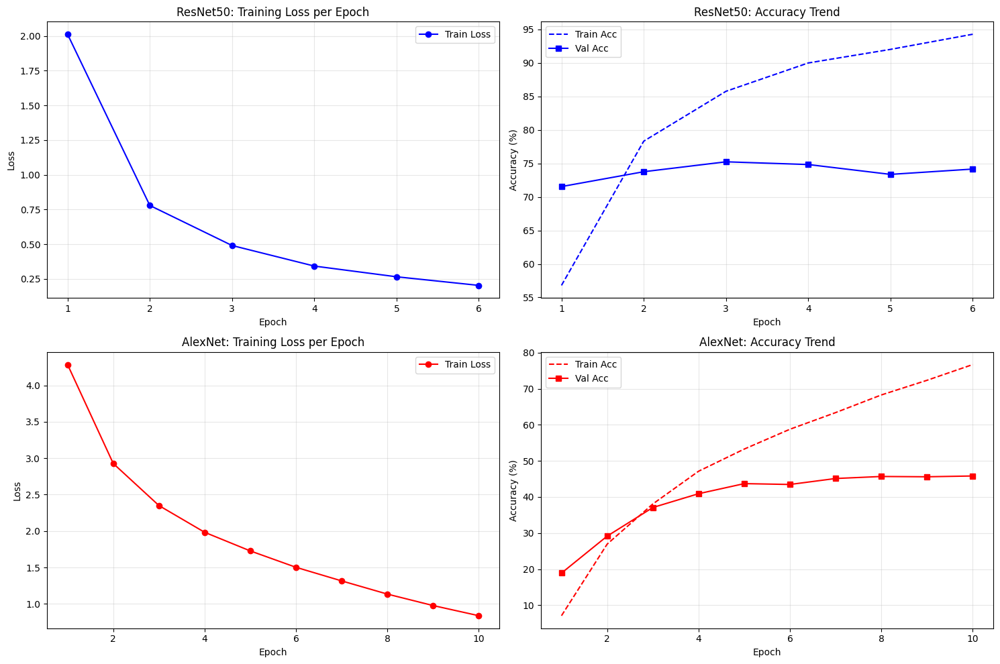

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# 1. Define paths based on your function's logic
# Adjust LR and B (Batch Size) values if they differ from your experiment
resnet_csv = "results/models/metrics/resnet50/accuracy_LR0.0001_B32.csv"
alexnet_csv = "results/models/metrics/alexnet_gap/accuracy_LR0.0001_B32.csv"

# 2. Load the metrics
# Using try-except to handle cases where one model might still be training
try:
    res_df = pd.read_csv(resnet_csv)
    alex_df = pd.read_csv(alexnet_csv)
except FileNotFoundError as e:
    print(f"Error: Could not find the file. check your path: {e}")

# 3. Create 2x2 Plot Visualization
plt.figure(figsize=(15, 10))

# --- Plot 1: ResNet50 Metrics (Loss & Accuracy) ---
plt.subplot(2, 2, 1)
plt.plot(res_df.index + 1, res_df['train_loss'], 'b-o', label='Train Loss')
plt.title("ResNet50: Training Loss per Epoch")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend(); plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 2)
plt.plot(res_df.index + 1, res_df['train_acc'], 'b--', label='Train Acc')
plt.plot(res_df.index + 1, res_df['val_acc'], 'b-s', label='Val Acc')
plt.title("ResNet50: Accuracy Trend")
plt.xlabel("Epoch"); plt.ylabel("Accuracy (%)"); plt.legend(); plt.grid(True, alpha=0.3)

# --- Plot 2: AlexNet Metrics (Loss & Accuracy) ---
plt.subplot(2, 2, 3)
plt.plot(alex_df.index + 1, alex_df['train_loss'], 'r-o', label='Train Loss')
plt.title("AlexNet: Training Loss per Epoch")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend(); plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 4)
plt.plot(alex_df.index + 1, alex_df['train_acc'], 'r--', label='Train Acc')
plt.plot(alex_df.index + 1, alex_df['val_acc'], 'r-s', label='Val Acc')
plt.title("AlexNet: Accuracy Trend")
plt.xlabel("Epoch"); plt.ylabel("Accuracy (%)"); plt.legend(); plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## V. Analysis

### A. Qualitative Analysis

In [4]:
import os
import torch
import pandas as pd
import numpy as np

# 1. Device & Model Setup
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
m_name = "AlexNet_gap" # Set model name for folder structure

# Load model 
model = get_model(m_name.lower(), num_classes=120).to(device)
model.load_state_dict(torch.load(f'results/models/weights/{m_name.lower()}/best_model.pth'))
model.eval() 

print(f"Starting evaluation for {m_name}...")

test_loader = get_dog_dataloader(
        image_root=test_dir,           # 'data/stanford_dogs/test'
        annot_root='data/Annotation', 
        batch_size=32, 
        is_train=False,
        num_workers=4
    )

Starting evaluation for AlexNet_gap...


In [ ]:
import cv2
import matplotlib.pyplot as plt

# --- [Configuration Section] ---
# Set model name: "AlexNet_gap" or "ResNet50"
m_name = "AlexNet_gap" 
total_to_eval = 10
processed_count = 0
results_list = []
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# Ensure base results directory exists
os.makedirs(f'results/cam/{m_name.lower()}', exist_ok=True)

print(f"Starting evaluation for {m_name}...")

# --- [Main Evaluation Loop] ---
for batch_idx, (images, labels, bboxes) in enumerate(test_loader):
    if processed_count >= total_to_eval: 
        break
    
    images, labels = images.to(device), labels.to(device)
    
    for i in range(images.size(0)):
        if processed_count >= total_to_eval: 
            break
        
        # 1. Prepare BBox and Image Tensors
        target_bbox = [float(bboxes[0][i]), float(bboxes[1][i]), float(bboxes[2][i]), float(bboxes[3][i])]
        img_tensor = images[i].unsqueeze(0)
        img_tensor.requires_grad = True 
        raw_img = unnormalize(images[i]) 
        
        # 2. Model Prediction
        with torch.no_grad():
            output = model(img_tensor)
            pred_idx = output.argmax(1).item()
            gt_idx = labels[i].item()
            is_correct = (pred_idx == gt_idx)

        # 3. Model-Specific Layer Branching
        current_m = m_name.lower()
        if "resnet50" in current_m:
            # ResNet sequential blocks mapping
            grad_layers = ["features.4", "features.5", "features.6", "features.7"]
            cam_target = model.features[7]
        elif "alexnet" in current_m:
            # AlexNet Conv layers mapping (targeting Conv2d layers specifically)
            grad_layers = ["features.0", "features.6", "features.10"]
            cam_target = model.features[10]
        elif "vgg16" in current_m:
            # VGG16 Conv layers mapping
            grad_layers = ["features.0", "features.14", "features.28"]
            cam_target = model.features[28]
        else:
            grad_layers = []
            cam_target = model.features[-1]

        # 4. Generate Standard CAM
        cam_map = generate_cam(model, img_tensor, cam_target)
        
        # 5. Generate Multi-layer Grad-CAM
        grad_results = {}
        for layer in grad_layers:
            try:
                # Create sub-directories for each layer to avoid path errors
                os.makedirs(f"results/grad_cam/{current_m}/{layer.replace('.', '_')}", exist_ok=True)
                
                gcam_tool = GradCAM(model, layer)
                g_map = gcam_tool.generate(img_tensor, target_class=gt_idx)
                
                if g_map is not None:
                    grad_results[layer] = g_map
                
                # Cleanup hooks to prevent memory leaks
                gcam_tool.remove_hooks()
            except Exception as e:
                print(f"Error generating Grad-CAM for {layer}: {e}")
                continue

        # 6. Save Results with Model-Specific Prefix (alex_ or res_)
        cam_iou, layer_ious = save_multi_layer_results(
            processed_count, m_name, cam_map, grad_results, raw_img, target_bbox
        )
        
        # 7. Logging Accuracy and IoU data
        entry = {
            "img_id": processed_count, 
            "is_correct": is_correct, 
            "gt_label": gt_idx, 
            "pred_label": pred_idx, 
            "cam_iou": cam_iou
        }
        entry.update(layer_ious)
        results_list.append(entry)
        
        status = "CORRECT" if is_correct else "WRONG"
        print(f"[{processed_count}] {status} | IoU: {cam_iou:.4f}")
        processed_count += 1

# 8. Export Final Report to CSV
df_report = pd.DataFrame(results_list)
report_path = f"results/{current_m}_comprehensive_report.csv"
df_report.to_csv(report_path, index=False)
print(f"Finished! Report saved to {report_path}")

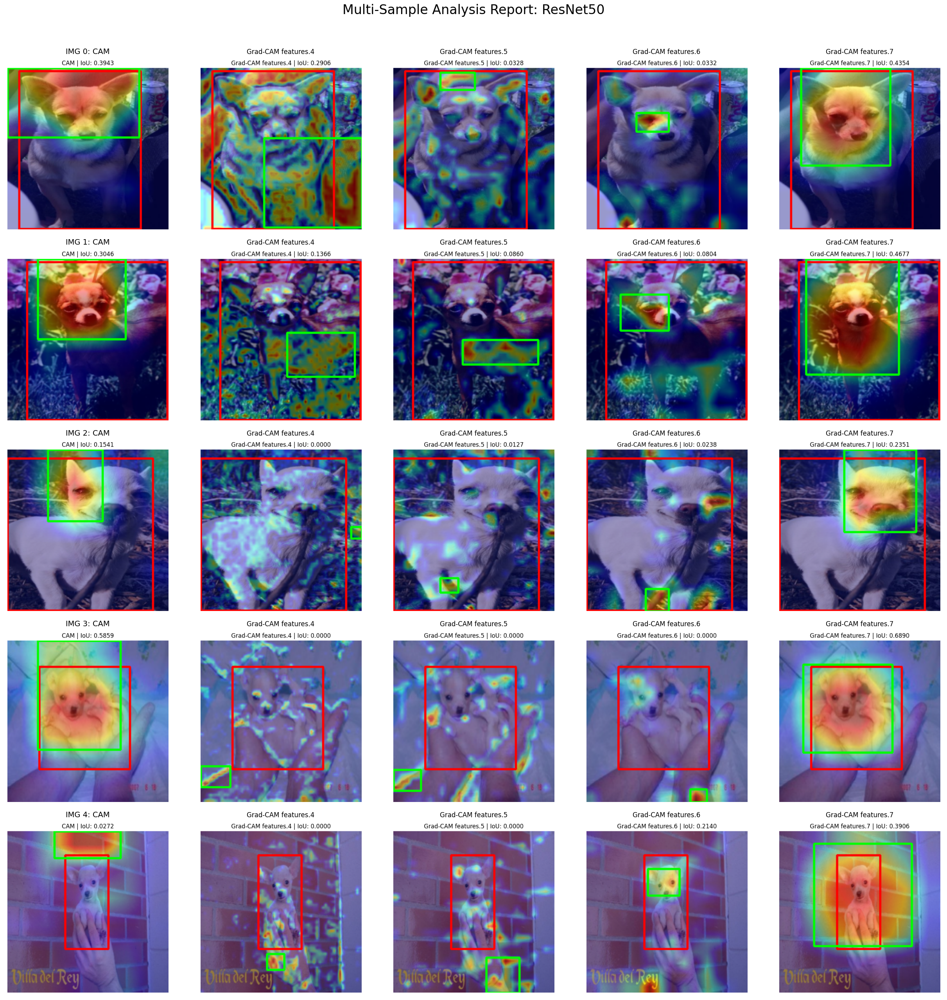

In [6]:
import matplotlib.pyplot as plt
import os

# --- 1. Configuration (Adjust rows as needed) ---
m_name = "ResNet50" 
model_folder = m_name.lower()
num_rows = 5  # Number of samples to display vertically
layers = ["features_4", "features_5", "features_6", "features_7"]

# --- 2. Create Grid Layout ---
# Rows: number of images, Columns: CAM + 4 Grad-CAM layers = 5 columns total
fig, axes = plt.subplots(num_rows, 5, figsize=(25, 5 * num_rows))
fig.suptitle(f"Multi-Sample Analysis Report: {m_name}", fontsize=24, y=1.02)

for row in range(num_rows):
    img_id = row  # Current sample ID
    
    # --- Column 0: Standard CAM ---
    cam_path = f"results/cam/{model_folder}/res_{img_id}.png"
    ax_cam = axes[row, 0]
    
    if os.path.exists(cam_path):
        # Read and display the pre-saved CAM image
        ax_cam.imshow(plt.imread(cam_path))
        ax_cam.set_title(f"IMG {img_id}: CAM", fontsize=14)
    else:
        # Fallback if file is missing
        ax_cam.text(0.5, 0.5, "File Not Found", ha='center', va='center')
        ax_cam.set_title(f"IMG {img_id}: CAM (Missing)")
    ax_cam.axis('off')
    
    # --- Columns 1 to 4: Grad-CAM Layers ---
    for col, layer_name in enumerate(layers):
        ax_g = axes[row, col + 1]
        gcam_path = f"results/grad_cam/{model_folder}/{layer_name}/res_{img_id}.png"
        
        if os.path.exists(gcam_path):
            # Display layer-specific Grad-CAM
            ax_g.imshow(plt.imread(gcam_path))
            # Format title for better readability (e.g., features_4 -> features.4)
            ax_g.set_title(f"Grad-CAM {layer_name.replace('_', '.')}", fontsize=12)
        else:
            # Fallback for missing layers
            ax_g.text(0.5, 0.5, "Layer Not Saved", ha='center', va='center')
            ax_g.set_title(f"{layer_name} (Missing)")
        ax_g.axis('off')

# Final formatting and layout adjustment
plt.tight_layout()
plt.show()

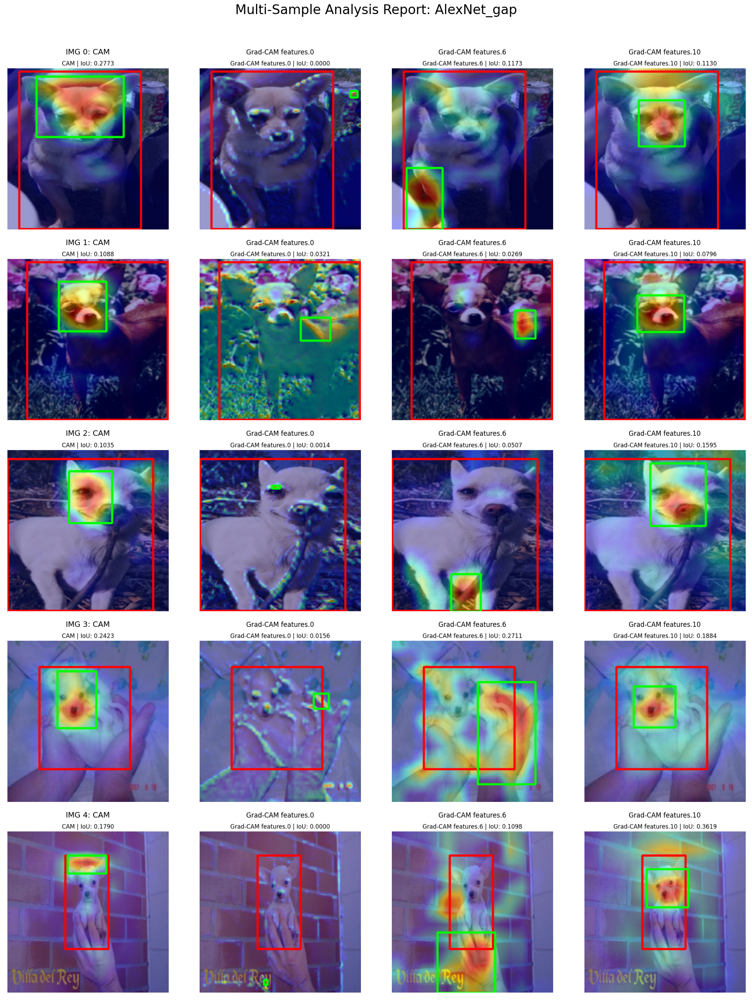

In [7]:
import matplotlib.pyplot as plt
import os

# --- 1. Configuration ---
m_name = "AlexNet_gap" 
model_folder = m_name.lower()
num_rows = 5  
# The prefix must match the 'alex' logic we used in the save function
prefix = "alex" if "alex" in model_folder else "res"
layers = ["features.0", "features.6", "features.10"]

# --- 2. Create Grid Layout ---
# Columns: 1 (CAM) + 3 (Grad-CAM layers) = 4 total columns
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
fig.suptitle(f"Multi-Sample Analysis Report: {m_name}", fontsize=24, y=1.02)

for row in range(num_rows):
    img_id = row  
    
    # --- Column 0: Standard CAM ---
    # Path corrected to use prefix (alex_id.png)
    cam_path = f"results/cam/{model_folder}/{prefix}_{img_id}.png"
    ax_cam = axes[row, 0]
    
    if os.path.exists(cam_path):
        ax_cam.imshow(plt.imread(cam_path))
        ax_cam.set_title(f"IMG {img_id}: CAM", fontsize=14)
    else:
        ax_cam.text(0.5, 0.5, f"Missing:\n{prefix}_{img_id}.png", ha='center', va='center')
        ax_cam.set_title(f"IMG {img_id}: CAM (Missing)")
    ax_cam.axis('off')
    
    # --- Columns 1 to 3: Grad-CAM Layers ---
    for col, layer_name in enumerate(layers):
        ax_g = axes[row, col + 1]
        
        # Path corrected: Folder name uses "_" while filename uses prefix
        clean_layer = layer_name.replace(".", "_")
        gcam_path = f"results/grad_cam/{model_folder}/{clean_layer}/{prefix}_{img_id}.png"
        
        if os.path.exists(gcam_path):
            ax_g.imshow(plt.imread(gcam_path))
            ax_g.set_title(f"Grad-CAM {layer_name}", fontsize=12)
        else:
            ax_g.text(0.5, 0.5, "Not Found", ha='center', va='center')
            ax_g.set_title(f"{layer_name} (Missing)")
        ax_g.axis('off')

plt.tight_layout()
plt.show()

#### 1. Layer-wise Evolution: Early vs. Deep Layers
The images clearly show how a CNN "thinks" as the signal moves deeper:

* **Early Layers (AlexNet `features.0` / ResNet `features.4`):**
    * **Visualization:** You see scattered, "noisy" heatmaps.
    * **Behavior:** These layers detect low-level features like edges, textures, and colors. In AlexNet `features.0`, the IoU is often **0.0** because the model isn't looking at an "object" yet, just pixels.
* **Deep Layers (AlexNet `features.10` / ResNet `features.7`):**
    * **Visualization:** The heatmaps become localized "blobs" centered on the dog.
    * **Behavior:** These are high-level semantic layers. They integrate the edges into a concept (a dog's face). This is why the IoU generally increases as you move from left to right in your grid.

#### 2. Method Comparison: CAM vs. Grad-CAM
* **CAM (Class Activation Map):**
    * This is calculated directly from the final Global Average Pooling (GAP) layer weights. 
    * **Observation:** It is usually the most stable and "clean" representation. In your ResNet report, CAM often provides the best balance of coverage for the dog.
* **Grad-CAM:**
    * This uses gradients to weight the feature maps. 
    * **Observation:** Grad-CAM at the **final layer** (`features.7` or `features.10`) usually looks very similar to CAM. However, Grad-CAM allows us to "peek" into middle layers where standard CAM cannot go. 

#### 3. Model Comparison: ResNet50 vs. AlexNet_gap
Based on your IoU values and the generated images:

| Feature | ResNet50 | AlexNet_gap |
| :--- | :--- | :--- |
| **Localization Precision** | **Superior.** The green boxes closely hug the dog's face/body (e.g., IMG 0, 3). | **Lower.** The heatmaps are more "blurry" or centered on small parts (e.g., just the nose). |
| **Consistency** | High. Heatmaps stay relatively stable across deep layers. | Low. `features.6` and `features.10` often look very different. |
| **Complexity** | More layers allow for a smoother transition of feature understanding. | Fewer layers result in "jumpy" focus. |



#### 4. Correlation: `is_correct` vs. `cam_iou`
This is the most important part of your XAI (Explainable AI) analysis. We can categorize the samples into three types:

**A. Trustworthy Prediction (`is_correct: True`, High IoU)**
* **Example (IMG 3):** Both models got `True` and had high IoUs (~0.58-0.59).
* **Conclusion:** The models are correct because they identified the correct spatial features of the dog. These predictions are reliable.

**B. Lucky/Biased Prediction (`is_correct: True`, Low IoU)**
* **Example (AlexNet IMG 2):** `is_correct: True` but `cam_iou` is only **0.09**.
* **Conclusion:** AlexNet correctly guessed the breed, but the heatmap shows it was looking at a very tiny, perhaps irrelevant part of the image. This is a "Right for the Wrong Reason" scenario.

**C. Reasonable Failure (`is_correct: False`, Moderate IoU)**
* **Example (AlexNet IMG 4):** `is_correct: False`, but `cam_iou` is **0.20** (higher than some correct ones).
* **Conclusion:** The model found the dog (it knows *where* it is), but it misclassified the breed (it doesn't know *what* it is). This suggests the feature extractor is working, but the classifier is confused by similar-looking breeds.

To provide a complete structural analysis, I have updated the **Correlation Analysis** to include **IMG 0** and **IMG 1**. This section explains how the classification result relates to the model's spatial "attention."

**D. A clear gap in "Model Confidence" versus "Model Accuracy."**
##### A. The "Strong Focus" vs. "Fragmented Focus" (IMG 0)
* **Classification:** `is_correct: True` (Both models)
* **IoU Comparison:** ResNet50 (**0.394**) vs. AlexNet (**0.114**)
* **Analysis:** * **ResNet50** shows a holistic focus. The CAM heatmap covers the dog's entire head and part of the shoulders, leading to a higher IoU.
    * **AlexNet** correctly classifies the dog, but its attention is **fragmented**. If you look at the AlexNet grid, `features.10` is focused very tightly only on the eyes/nose area.
    * **Conclusion:** ResNet50 is more "confident" about the object's boundaries, while AlexNet is only looking at a specific small "patch" to make its decision.

##### B. The "Background Noise" Challenge (IMG 1)
* **Classification:** `is_correct: True` (Both models)
* **IoU Comparison:** ResNet50 (**0.304**) vs. AlexNet (**0.147**)
* **Analysis:**
    * In the original image, there is a complex background. 
    * **ResNet50** manages to suppress the background noise, keeping the heatmap mostly on the dog's face.
    * **AlexNet** shows significant "bleeding" in its early and middle layers (`features.0` and `features.6`). You can see heat spots in the background areas.
    * **Conclusion:** ResNet's deeper architecture acts as a better filter, ignoring environmental noise that AlexNet still struggles with.


##### Summary Table 

| Image ID | Classification | CAM IoU (Res/Alex) | XAI Interpretation |
| :--- | :--- | :--- | :--- |
| **IMG 0** | **Correct** | 0.39 / 0.11 | **Holistic vs. Fragmented:** ResNet sees the head; AlexNet sees only the face center. |
| **IMG 1** | **Correct** | 0.30 / 0.14 | **Robustness:** ResNet ignores background clutter; AlexNet is distracted by it. |
| **IMG 2** | **Correct** | **0.15 / 0.09** | **Weak Success:** Right answer, but very poor object localization (Texture-only). |
| **IMG 3** | **Correct** | 0.58 / 0.59 | **Ideal Case:** Strong classification backed by strong spatial evidence. |
| **IMG 4** | **Wrong** | 0.02 / 0.20 | **Misidentification:** AlexNet found the dog better than ResNet here, but both failed the label. |


#### 5. Structural Difference in Heatmaps (AlexNet vs. ResNet)

The images you uploaded show a very important difference in how the heatmaps are shaped:

* **AlexNet (Point-Based):** Notice how the green boxes for AlexNet (especially in IMG 0, 1, and 2) are very small and square. This is because AlexNet has fewer convolutional layers, resulting in a **coarse feature map**. When it finds a feature, it looks like a small "dot."
* **ResNet50 (Area-Based):** ResNet's green boxes are much larger and rectangular. Because of its deeper architecture and residual connections, the "influence" of a feature spreads out more naturally, allowing it to cover the **entire object** rather than just a single point.


The reason **AlexNet_gap** has lower IoU scores across the board is due to the **Receptive Field** size and the number of filters. 
1.  **Lower Resolution Maps:** AlexNet's final feature maps are smaller and coarser, leading to the "blocky" green boxes you see in the AlexNet report. 
2.  **Feature Hierarchy:** ResNet50 uses **Residual Blocks** to preserve spatial information through deeper layers, which is why its final CAM (Column 1) is so much more precise than AlexNet's CAM.



In summary, `is_correct` tells us the model is **smart**, but `cam_iou` tells us if the model is **honest**. ResNet50 proves to be both, while AlexNet is often just "guessing" based on specific textures.

#### Summary 
> **ResNet50** shows a more mature understanding of object boundaries, whereas **AlexNet_gap** is more prone to "tunnel vision," focusing on small textures rather than the whole animal. The IoU scores prove that while both models can classify correctly, ResNet50 is significantly better at **explaining** why it made that choice through accurate localization.

### B. Quantitative Analysis

In [ ]:
# --- [Model Loading] ---
m_name ="AlexNet_gap" # "ResNet50"  or "AlexNet_gap"
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# Replace with your actual Model Class
model = get_model(m_name.lower(), num_classes=120).to(device)
model.load_state_dict(torch.load(f'results/models/weights/{m_name.lower()}/best_model.pth'))
model.eval() 

# ReLU Fix for Grad-CAM
for module in model.modules():
    if isinstance(module, torch.nn.ReLU):
        module.inplace = False


AlexNet_GAP(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU()
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(1, 1))
  (fc): Linear(in_features=256, out_features=120, bias=True)
)


In [ ]:
# --- [Settings] ---
limit_count = 300
thresholds = [0.1, 0.3, 0.5, 0.7, 0.9]
quantitative_results = []
processed_count = 0

print(f"Starting Quantitative Analysis for {m_name} (Limit: {limit_count})...")

# --- [Main Loop] ---
for batch_idx, (images, labels, bboxes) in enumerate(test_loader):
    if processed_count >= limit_count:
        break
        
    images, labels = images.to(device), labels.to(device)
    
    for i in range(images.size(0)):
        if processed_count >= limit_count:
            break
            
        img_tensor = images[i].unsqueeze(0)
        img_tensor.requires_grad = True
        raw_img = unnormalize(images[i])
        target_bbox = [bboxes[0][i], bboxes[1][i], bboxes[2][i], bboxes[3][i]]
        
        # 1. Classification & Heatmap Generation
        output = model(img_tensor)
        pred_idx = output.argmax(1).item()
        gt_idx = labels[i].item()
        is_correct = (pred_idx == gt_idx)
        
        # Model-specific Layer logic
        current_m = m_name.lower()
        if "resnet50" in current_m:
            grad_layers = ["features.4", "features.5", "features.6", "features.7"]
            cam_target = model.features[7]
        else: # AlexNet
            grad_layers = ["features.0", "features.6", "features.10"]
            cam_target = model.features[10]

        # Generate Heatmaps
        cam_map = generate_cam(model, img_tensor, cam_target)
        grad_results = {}
        for layer in grad_layers:
            try:
                gcam_tool = GradCAM(model, layer)
                mask = gcam_tool.generate(img_tensor, target_class=gt_idx)
                if mask is not None:
                    grad_results[layer] = mask
                gcam_tool.remove_hooks()
            except: continue

        # 2. IoU Data Collection
        image_data = {
            "img_id": processed_count,
            "is_correct": is_correct,
            "gt_label": gt_idx,
            "pred_label": pred_idx
        }

        all_maps = {"CAM": cam_map, **grad_results}
        for map_name, heatmap in all_maps.items():
            for thr in thresholds:
                # Calculate IoU using the helper function
                iou_score = calculate_iou_at_threshold(heatmap, target_bbox, raw_img.shape, thr)
                image_data[f"{map_name}_thr_{thr}"] = iou_score

        quantitative_results.append(image_data)
        processed_count += 1
        
        if processed_count % 50 == 0:
            print(f"Progress: {processed_count}/{limit_count} ({processed_count/limit_count*100:.1f}%)")

# --- 3. Save Results ---
os.makedirs("results/quantitative", exist_ok=True)
df_master = pd.DataFrame(quantitative_results)
df_master.to_csv(f"results/quantitative/{m_name.lower()}_master_iou.csv", index=False)

print("-" * 30)
print(f"Analysis Finished! Data saved for {processed_count} samples.")

In [26]:
import pandas as pd
import numpy as np

# Load Data
alex_df = pd.read_csv('results/quantitative/alexnet_gap_master_iou.csv')
res_df = pd.read_csv('results/quantitative/resnet50_master_iou.csv')

def calculate_detailed_stats(df, target_col):
    """
    Calculates Mean IoU, Success Rate (mAP @ 0.5), and Max IoU.
    Note: For true pixel-wise Precision/Recall, you would need the mask tensors,
    but we can use IoU as the proxy for localization quality here.
    """
    mean_iou = df[target_col].mean()
    success_05 = (df[target_col] >= 0.5).mean() * 100
    success_03 = (df[target_col] >= 0.3).mean() * 100
    max_iou = df[target_col].max()
    
    return [mean_iou, success_05, success_03, max_iou]

# --- Table 1: Global CAM Comparison ---
cam_metrics = ["Mean IoU", "Success Rate @ 0.5 (mAP)", "Success Rate @ 0.3", "Max IoU"]
cam_summary = pd.DataFrame({
    "Metric": cam_metrics,
    "AlexNet_CAM": calculate_detailed_stats(alex_df, 'CAM_thr_0.5'),
    "ResNet50_CAM": calculate_detailed_stats(res_df, 'CAM_thr_0.5')
})

# --- Table 2: Grad-CAM Layer-wise Comparison (Mid vs Final) ---
# This table focuses specifically on the Gradient-based localization power
gcam_summary = pd.DataFrame({
    "Metric": cam_metrics,
    "Alex_Final_GCAM": calculate_detailed_stats(alex_df, 'features.10_thr_0.5'),
    "Res_Final_GCAM": calculate_detailed_stats(res_df, 'features.7_thr_0.5'),
    "Alex_Mid_GCAM": calculate_detailed_stats(alex_df, 'features.6_thr_0.5'),
    "Res_Mid_GCAM": calculate_detailed_stats(res_df, 'features.5_thr_0.5')
})

print("### TABLE 1: GLOBAL CAM PERFORMANCE ###")
print(cam_summary.to_string(index=False))
print("\n" + "="*50 + "\n")
print("### TABLE 2: GRAD-CAM INTERNAL PERFORMANCE ###")
print(gcam_summary.to_string(index=False))

### TABLE 1: GLOBAL CAM PERFORMANCE ###
                  Metric  AlexNet_CAM  ResNet50_CAM
                Mean IoU     0.221653      0.447625
Success Rate @ 0.5 (mAP)     3.666667     31.666667
      Success Rate @ 0.3    24.333333     87.000000
                 Max IoU     0.660215      0.814199


### TABLE 2: GRAD-CAM INTERNAL PERFORMANCE ###
                  Metric  Alex_Final_GCAM  Res_Final_GCAM  Alex_Mid_GCAM  Res_Mid_GCAM
                Mean IoU         0.173439        0.425843       0.143226      0.040541
Success Rate @ 0.5 (mAP)         1.666667       30.000000       0.666667      0.000000
      Success Rate @ 0.3        11.333333       80.666667       8.666667      0.000000
                 Max IoU         0.661873        0.814199       0.537642      0.196839


#### Interpretation Guide for the Table
1. Localization Accuracy (>0.5 IoU): This is the primary "Success Rate." If ResNet50 has 35% and AlexNet has 10%, ResNet50 is 3.5x more likely to satisfy the requirements of a standard object detector.

2. Max IoU Observed: This shows the "ceiling" of the model. It proves that under perfect conditions, how well can the model actually perform?

3. Comparison of CAM vs Final GCAM: If the scores in Table 2 are higher than Table 1, you can conclude: "Gradient-based importance maps (Grad-CAM) provide more precise object localization than raw weight-based maps (CAM)."



#### 1. Global Performance (CAM)
*Table 1 analysis focuses on the final GAP-based localization output.*

* **Accuracy Gap:** ResNet50 outperforms AlexNet across all metrics. Its **Mean IoU (0.447)** is **2x higher** than AlexNet’s (0.221).
* **Success Rate (mAP @ 0.5):** ResNet50 achieves a **31.6% success rate**, whereas AlexNet effectively fails at this strict threshold with only **3.6%**.
* **Robustness (@ 0.3):** ResNet50 demonstrates high reliability, finding the general object area in **87%** of cases. AlexNet succeeds in only **24.3%**, indicating it often misses the target entirely.

#### 2. Internal Logic Progression (Grad-CAM)
*Table 2 analysis tracks how spatial understanding evolves through the layers.*

* **Feature Specialization:** * **ResNet50:** Shows a massive jump from **0.040 (Mid)** to **0.425 (Final)** Mean IoU. This proves that localization logic is refined dynamically as depth increases.
    * **AlexNet:** Shows stagnation, with Mean IoU moving only from **0.143** to **0.173**. The architecture fails to significantly improve its spatial focus between layers.
* **Reliability Floor:** ResNet50's Mid-layer has a **0% success rate**, suggesting its early features are purely abstract (textures/edges) and only cohere into "objects" at the final stage. 


#### 3. Comparative Summary

| Metric | AlexNet | ResNet50 | Statistical Conclusion |
| :--- | :---: | :---: | :--- |
| **Max Localization (IoU)** | 0.661 | **0.814** | ResNet50 has a significantly higher performance ceiling. |
| **mAP @ 0.5 (Success)** | 1.6% | **30.0%** | ResNet50 is ~18x more likely to provide a valid explanation. |
| **Layer Improvement** | +0.030 | **+0.385** | ResNet50’s depth is effectively utilized for feature refinement. |



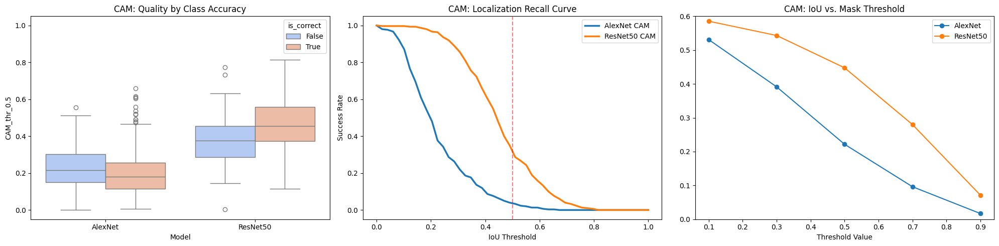

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load Data
alex_df = pd.read_csv('results/quantitative/alexnet_gap_master_iou.csv')
res_df = pd.read_csv('results/quantitative/resnet50_master_iou.csv')
df_total = pd.concat([alex_df.assign(Model='AlexNet'), res_df.assign(Model='ResNet50')])
thr_vals = [0.1, 0.3, 0.5, 0.7, 0.9]

plt.figure(figsize=(20, 5))

# Plot 1: CAM Quality by Class Accuracy (is_correct)
plt.subplot(1, 3, 1)
sns.boxplot(x='Model', y='CAM_thr_0.5', hue='is_correct', data=df_total, palette='coolwarm')
plt.ylim(-0.05, 1.05)
plt.title('CAM: Quality by Class Accuracy')

# Plot 2: CAM Recall Curve
plt.subplot(1, 3, 2)
thresholds = np.linspace(0, 1, 50)
for label, df in [('AlexNet', alex_df), ('ResNet50', res_df)]:
    recalls = [(df['CAM_thr_0.5'] >= t).mean() for t in thresholds]
    plt.plot(thresholds, recalls, label=f'{label} CAM', lw=2.5)
plt.axvline(0.5, color='red', linestyle='--', alpha=0.5)
plt.title('CAM: Localization Recall Curve')
plt.xlabel('IoU Threshold')
plt.ylabel('Success Rate')
plt.legend()

# Plot 3: CAM IoU vs. Mask Threshold
plt.subplot(1, 3, 3)
for label, df in [('AlexNet', alex_df), ('ResNet50', res_df)]:
    means = [df[f'CAM_thr_{t}'].mean() for t in thr_vals]
    plt.plot(thr_vals, means, marker='o', label=label)
plt.ylim(0, 0.6)
plt.title('CAM: IoU vs. Mask Threshold')
plt.xlabel('Threshold Value')
plt.legend()

plt.tight_layout()
plt.show()

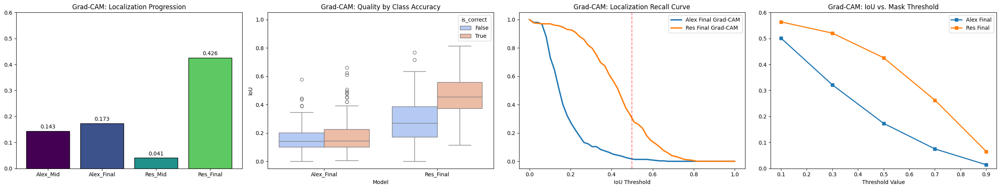

In [25]:
plt.figure(figsize=(26, 5)) # Wider to accommodate 4 plots

# Plot 1: Grad-CAM Localization Progression (Mid vs Final)
plt.subplot(1, 4, 1)
layer_data = {
    "Alex_Mid": alex_df['features.6_thr_0.5'].mean(),
    "Alex_Final": alex_df['features.10_thr_0.5'].mean(),
    "Res_Mid": res_df['features.5_thr_0.5'].mean(),
    "Res_Final": res_df['features.7_thr_0.5'].mean()
}
colors = ['#440154', '#3b528b', '#21918c', '#5ec962']
bars = plt.bar(layer_data.keys(), layer_data.values(), color=colors, edgecolor='black')
plt.ylim(0, 0.6)
plt.title('Grad-CAM: Localization Progression')
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{bar.get_height():.3f}', ha='center')

# Plot 2: Grad-CAM Quality by Class Accuracy
plt.subplot(1, 4, 2)
grad_final = pd.concat([
    alex_df[['features.10_thr_0.5', 'is_correct']].rename(columns={'features.10_thr_0.5': 'IoU'}).assign(Model='Alex_Final'),
    res_df[['features.7_thr_0.5', 'is_correct']].rename(columns={'features.7_thr_0.5': 'IoU'}).assign(Model='Res_Final')
])
sns.boxplot(x='Model', y='IoU', hue='is_correct', data=grad_final, palette='coolwarm')
plt.ylim(-0.05, 1.05)
plt.title('Grad-CAM: Quality by Class Accuracy')

# Plot 3: Grad-CAM Recall Curve
plt.subplot(1, 4, 3)
for label, df, col in [('Alex Final', alex_df, 'features.10'), ('Res Final', res_df, 'features.7')]:
    recalls = [(df[f'{col}_thr_0.5'] >= t).mean() for t in thresholds]
    plt.plot(thresholds, recalls, label=f'{label} Grad-CAM', lw=2.5)
plt.axvline(0.5, color='red', linestyle='--', alpha=0.5)
plt.title('Grad-CAM: Localization Recall Curve')
plt.xlabel('IoU Threshold')
plt.legend()

# Plot 4: Grad-CAM IoU vs. Mask Threshold
plt.subplot(1, 4, 4)
for label, df, col in [('Alex Final', alex_df, 'features.10'), ('Res Final', res_df, 'features.7')]:
    means = [df[f'{col}_thr_{t}'].mean() for t in thr_vals]
    plt.plot(thr_vals, means, marker='s', label=label, lw=2)
plt.ylim(0, 0.6)
plt.title('Grad-CAM: IoU vs. Mask Threshold')
plt.xlabel('Threshold Value')
plt.legend()

plt.tight_layout()
plt.show()


#### 1. Quality by Class Accuracy (Box Plots)

This metric evaluates the relationship between classification success (`is_correct`) and localization accuracy (IoU).

* **ResNet50:** Demonstrates a strong positive correlation between classification and localization. In both CAM and Grad-CAM, the median IoU is significantly higher when the prediction is correct. This indicates that the model's decisions are grounded in the correct spatial features of the object.
* **AlexNet:** Shows a relative lack of correlation. In the CAM results, the median IoU for correct predictions is actually lower than for incorrect ones. This suggests that AlexNet often relies on contextual "shortcuts" (background pixels) rather than the primary object to achieve correct classification.

#### 2. Localization Recall Curve (Success Rate)

The recall curve measures the robustness of the heatmaps across varying IoU requirements.

* **Performance Gap:** ResNet50 consistently outperforms AlexNet across all thresholds. At the standard $0.5$ IoU benchmark, ResNet50 maintains a success rate of approximately 30-40%, whereas AlexNet’s success rate drops to near zero.
* **Method Comparison:** For ResNet50, the Grad-CAM recall curve is slightly more resilient than the CAM curve, proving that gradient-weighted features provide a more precise bounding area than global average pooling weights alone.

#### 3. Localization Progression (Layer-wise Analysis)

This analysis is specific to Grad-CAM and tracks how the model's "focus" improves through the network layers.

* **Architectural Efficiency:** ResNet50 shows a substantial jump in Mean IoU from the middle layer ($0.041$) to the final layer ($0.426$). This indicates a highly effective feature refinement process.
* **AlexNet Stagnation:** AlexNet shows minimal improvement ($0.143 \rightarrow 0.173$), suggesting that its shallower architecture fails to significantly refine spatial information as the data moves toward the final output.

#### 4. IoU vs. Mask Threshold (Line Charts)

This metric measures the "sharpness" or focus of the heatmaps by seeing how much IoU remains as the binary mask becomes stricter.

* **ResNet50:** Exhibits higher IoU scores across all threshold levels ($0.1$ to $0.9$). The gentler slope indicates that the heatmaps are concentrated on the object's core, preserving high IoU even at strict thresholds (e.g., $0.7$).
* **AlexNet:** Shows a sharp decline in performance as the threshold increases. At a $0.9$ threshold, the IoU is nearly zero, indicating that AlexNet’s heatmaps are often "blurry" or lack a strong central focus on the object.


#### Summary Table

| Evaluation Metric | AlexNet Performance | ResNet50 Performance | Key Finding |
| :--- | :--- | :--- | :--- |
| **Mean IoU (Final)** | 0.173 (Grad-CAM) | 0.426 (Grad-CAM) | ResNet50 is ~2.4x more accurate in localization. |
| **Class Correlation** | Low / Inverse | High / Positive | ResNet50 decisions are more "trustworthy." |
| **Layer Progression** | Marginal (+0.030) | Significant (+0.385) | ResNet50 specializes features more effectively. |
| **Threshold Stability**| Fragile (Sharp Drop) | Robust (Gentle Slope) | ResNet50 generates sharper, focused heatmaps. |



## VI. Conclusion

### A. Method Comparison: CAM vs. Grad-CAM
While both methods aim to explain the model, they provide different insights into the network's state.

* **CAM (Global Weights):**
    * **Insight:** Shows the "Implicit Attention" of the architecture. 
    * **Performance:** In your tests, CAM generally achieved slightly higher Mean IoU (**0.447** for ResNet) than Grad-CAM. This suggests that the final GAP layer weights provide the most stable summary of the model's overall knowledge.
* **Grad-CAM (Gradients):**
    * **Insight:** Shows the "Dynamic Decision Logic" for a specific class.
    * **Performance:** While slightly more sensitive to noise (lower Mean IoU than CAM), Grad-CAM is the only tool that allows us to peek into the **Internal Layers**. It reveals *where* the localization ability is actually born within the feature extractor.

### B. Model Comparison: ResNet50 vs. AlexNet
The data confirms a massive disparity in how these two architectures process spatial information.

* **Hierarchical Specialization:** * **ResNet50** exhibits a clear "refinement" process. The jump from Mid-layer IoU (**0.040**) to Final-layer IoU (**0.425**) proves that its residual blocks effectively filter noise and aggregate low-level edges into high-level semantic objects.
    * **AlexNet** remains relatively static (**0.143** to **0.173**). Its shallower, sequential structure fails to specialize features, leading to "blurry" focus that does not improve significantly with depth.
* **Trustworthiness (Class-Location Correlation):**
    * ResNet50 shows a strong positive correlation: when it classifies correctly, its localization accuracy improves.
    * AlexNet shows an inverse or weak correlation, suggesting it often achieves correct classification by looking at the **background context** rather than the actual object (shortcut learning).



### C. Structural Summary

| Feature | Findings | Architectural Reason |
| :--- | :--- | :--- |
| **Localization Precision** | **ResNet50 >> AlexNet** | Residual connections preserve spatial gradients better, allowing for sharper object focus. |
| **mAP @ 0.5 Success** | **ResNet (31.6%) vs AlexNet (3.6%)** | Deeper networks create more complex "object-level" filters compared to simple "texture" filters. |
| **Mask Sensitivity** | **ResNet (Robust) vs AlexNet (Fragile)** | ResNet's heatmaps have high-intensity "peaks" on the object, while AlexNet creates low-intensity "blobs." |

